In [1]:
import anndata as ad
import re
import os
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
%matplotlib inline

import sys
sys.path.append(os.getcwd())

from GLOBAL_VARIABLES.GLOBAL_VARIABLES import cc_mapping_package_dir
sys.path.append(cc_mapping_package_dir)

from cc_mapping import preprocess
from cc_mapping import plot
from cc_mapping import core
from cc_mapping import manifold

In [2]:
cell_line = 'CFPAC'
main_dir = "C:/Users/dap182/Documents/Stallaert_lab/PDAC_pipeline"

data_dir = f'{main_dir}/data'
data_file = f'{data_dir}/{cell_line}/{cell_line}.h5ad'

adata = ad.read_h5ad(data_file)

adata

AnnData object with n_obs × n_vars = 33550 × 569
    obs: 'WellID', 'condition', 'state', 'DNA_content', 'phase', 'phase_colors', 'genome', 'cell_line', 'CellID', 'GMM_phase', 'GMM_phase_colors', 'norm_Int_Intg_DNA_nuc'
    var: 'X_features'
    uns: 'dpt_pseudotimes', 'feature_sets', 'wayne_PHATE_2D', 'wayne_PHATE_3D'

In [3]:
#ensure that cells can be identified after filtering
#This data contains all CFPAC cells, if you split the data and then save it. Do not change the CellID
adata.obs['CellID'] = adata.obs.index

In [4]:
#ensure that the adata.var_names are the features of the dataset
adata.var_names = adata.var['X_features']

In [5]:
#isolates diploid cells from the dataset using the adata.obs['genome'] column
adata = preprocess.row_data_partitioning(adata, search_str = 'diploid', search_obs = 'genome')


Classification Report for RF model trained with given feature set
##################################################################

              precision    recall  f1-score   support

          G0       1.00      1.00      1.00       633
          G1       0.99      1.00      1.00      3187
          G2       0.99      0.98      0.98      1198
           M       0.99      0.94      0.96       201
           S       0.97      0.97      0.97       836

    accuracy                           0.99      6055
   macro avg       0.99      0.98      0.98      6055
weighted avg       0.99      0.99      0.99      6055



Training RF model iteratively using most important RF features until 10 stable iterations:  22%|██▏       | 18/83 [00:15<00:56,  1.15it/s]



Classification Report for RF model trained with given feature set
##################################################################

              precision    recall  f1-score   support

          G0       1.00      1.00      1.00       633
          G1       0.99      1.00      1.00      3187
          G2       1.00      0.96      0.98      1198
           M       1.00      0.99      0.99       201
           S       0.94      0.98      0.96       836

    accuracy                           0.99      6055
   macro avg       0.99      0.98      0.99      6055
weighted avg       0.99      0.99      0.99      6055


##################################################################################

Optimal Feature Set sorted by RF feature importance
###################################################
['Int_Intg_DNA_nuc' 'Int_Med_cycA_nuc' 'Int_pRB_over_RB_nuc'
 'Int_Med_pRB_nuc' 'AreaShape_Area_nuc' 'Int_Med_Skp2_nuc'
 'Int_Med_E2F1_nuc' 'Int_Med_CDK2_nuc' 'Int_Med_pp21_nuc'
 'Int_Med

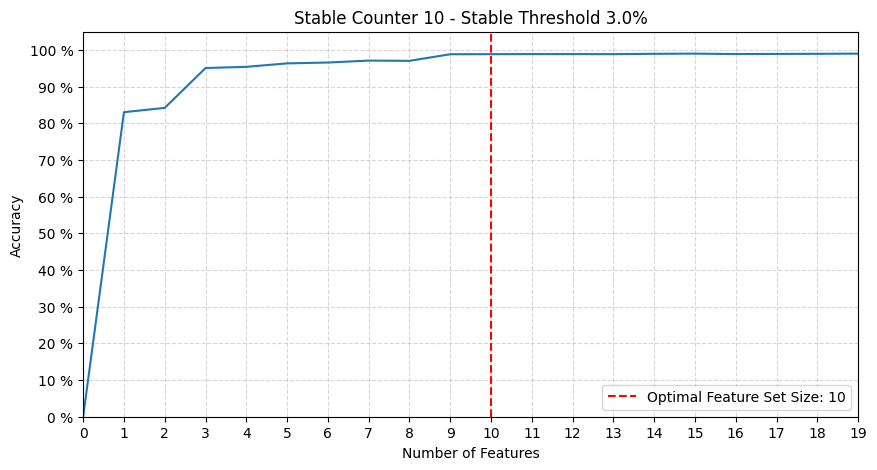

In [6]:
#optional: you can add a custom feature set by adding it to adata.var 

#creates a smaller training feature set for random forest
regex='((Std_PCNA|^Int_Intg_DNA|over_|Med_).*(nuc))|((AreaShape_Area).*(nuc|cell))'
training_features =  [feat for feat in adata.var_names if re.search(regex, feat) != None]

rf_threshold = 0.03

#runs random forest for feature selection
adata = core.random_forest_feature_selection(adata=adata,
                                             training_feature_set= training_features,
                                             training_labels = 'phase',
                                             method = 'RF_min_max',
                                             stable_counter=10,
                                             threshold=rf_threshold,
                                             feature_set_name=f'RMM_DIP_{rf_threshold}')

In [7]:
#Example of how to define your own feature set. Needs to be a list of booleans with the same length as the number of features

#'all_features' could be used in all subsequent functions for the feature_set parameter
adata.var['all_features'] = np.repeat(True, adata.shape[1])

In [8]:
adata

AnnData object with n_obs × n_vars = 24219 × 569
    obs: 'WellID', 'condition', 'state', 'DNA_content', 'phase', 'phase_colors', 'genome', 'cell_line', 'CellID', 'GMM_phase', 'GMM_phase_colors', 'norm_Int_Intg_DNA_nuc'
    var: 'X_features', 'RMM_DIP_0.03', 'all_features'
    uns: 'dpt_pseudotimes', 'feature_sets', 'wayne_PHATE_2D', 'wayne_PHATE_3D'

In [9]:
adata.layers[f'diploid_z-score'] = st.zscore(adata.X.copy(), axis = 0)

adata

AnnData object with n_obs × n_vars = 24219 × 569
    obs: 'WellID', 'condition', 'state', 'DNA_content', 'phase', 'phase_colors', 'genome', 'cell_line', 'CellID', 'GMM_phase', 'GMM_phase_colors', 'norm_Int_Intg_DNA_nuc'
    var: 'X_features', 'RMM_DIP_0.03', 'all_features'
    uns: 'dpt_pseudotimes', 'feature_sets', 'wayne_PHATE_2D', 'wayne_PHATE_3D'
    layers: 'diploid_z-score'

In [10]:
phate_param_dict = {'n_components': 2,
                    'knn': [50,75],
                    'gamma': [0,0.5],
                    't': [10,25],
                    'n_jobs': -1,
                    'random_state': 0,
                    'verbose': 0}

param_info_dict = { 'row_label': 'gamma',
                    'col_label': 't',
                    'constant_label': 'knn',
                    'final_figure_dims': (1,2)}

fig_dir = os.path.join(os.getcwd() , 'figs')
if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)

manifold.perform_phate_hyperparameter_search(adata,
                                        feature_set = f'RMM_DIP_{rf_threshold}',
                                        hyperparam_dict = phate_param_dict,
                                        hyperparam_info_dict = param_info_dict,
                                        layer = f'diploid_z-score',
                                        color_name= 'phase_colors',
                                        legend = True,
                                        save_path = f'./figs/{cell_line}_hyperparameter_search.png',)

Generating hyperparameter search plots: 100%|██████████| 2/2 [02:30<00:00, 75.30s/it]


In [11]:
phate_optimal_parameter_dict = {'t': 10 , 'gamma': 0 , 'knn': 75, 'random_state': 0}

adata = manifold.run_phate(adata, 
                            feature_set = f'RMM_DIP_{rf_threshold}', 
                            phate_param_dict = phate_optimal_parameter_dict,
                            layer = f'diploid_z-score',
                            obsm_save_key = 'X_phate')

Calculating PHATE...
  Running PHATE on 24219 observations and 10 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 10.30 seconds.
    Calculating affinities...
    Calculated affinities in 0.81 seconds.
  Calculated graph and diffusion operator in 11.24 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 5.07 seconds.
    Calculating KMeans...
    Calculated KMeans in 3.97 seconds.
  Calculated landmark operator in 10.33 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.34 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.28 seconds.
Calculated PHATE in 25.21 seconds.


In [12]:
adata

AnnData object with n_obs × n_vars = 24219 × 569
    obs: 'WellID', 'condition', 'state', 'DNA_content', 'phase', 'phase_colors', 'genome', 'cell_line', 'CellID', 'GMM_phase', 'GMM_phase_colors', 'norm_Int_Intg_DNA_nuc'
    var: 'X_features', 'RMM_DIP_0.03', 'all_features'
    uns: 'dpt_pseudotimes', 'feature_sets', 'wayne_PHATE_2D', 'wayne_PHATE_3D'
    obsm: 'X_phate'
    layers: 'diploid_z-score'

<Axes: >

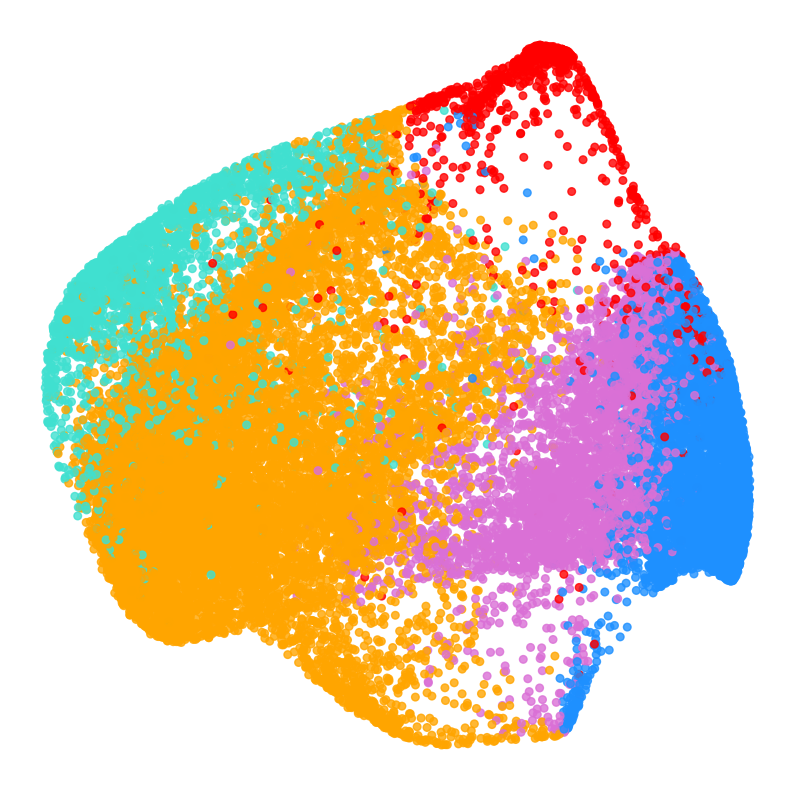

In [13]:
kwargs = {'s': 30,
            'alpha': 0.8,
            'rasterized': True,
          }

manifold.plot_phate_coords(adata = adata,
                           colors = 'phase_colors',
                           kwargs = kwargs,)

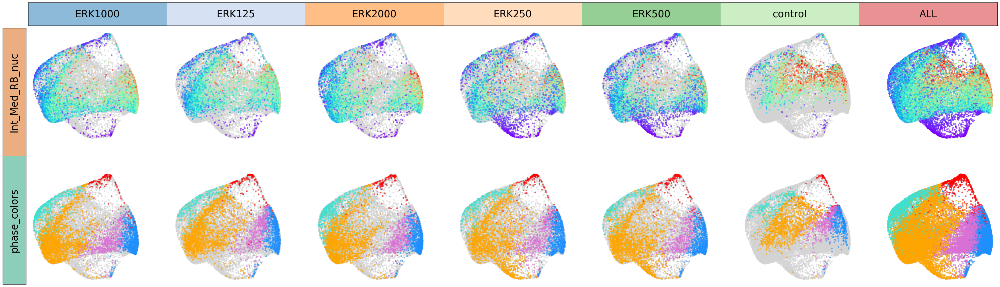

In [14]:
colors = ['Int_Med_RB_nuc', 'phase_colors']

kwargs = {'s': 10,
            'alpha': 0.5,
            'rasterized': True,
          }

#different permutations of the plot_row_partitions function
plot.plot_row_partitions(adata,
                         obs_search_term = 'condition', 
                         colors = colors,
                         plot_all = True,
                         unit_size =5,
                         kwargs = kwargs)


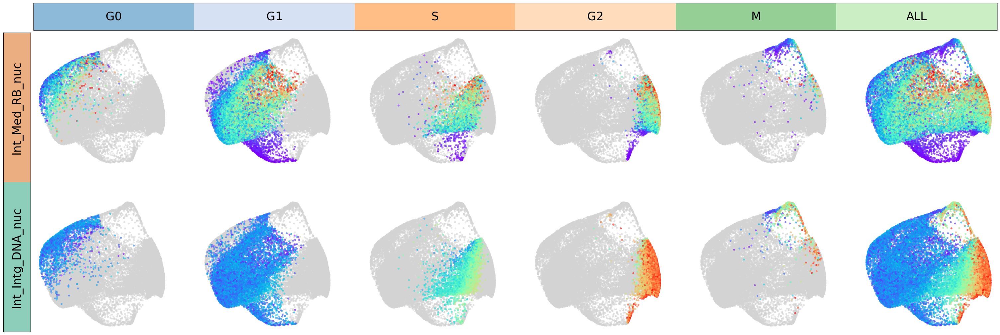

In [15]:
colors = ['Int_Med_RB_nuc', 'Int_Intg_DNA_nuc']

plot.plot_row_partitions(adata,
                         obs_search_term = 'phase', 
                         colors = colors,
                         unit_size =5,
                         column_labels = ['G0', 'G1', 'S', 'G2','M', 'ALL'],
                         kwargs = kwargs)